# CFD Data Analysis

Interactive analysis of `.dog` files in `vivana_cfd_data_pipeline`.

This notebook:
- loads `.dog` files robustly
- infers `U_r` from folder names like `comb_Ur4`
- plots per-case displacement, velocity, acceleration, force, and PSDs
- writes a `summary.csv` and a summary plot versus `U_r`


In [1]:
from __future__ import annotations

import importlib
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["axes.grid"] = True

if Path("vivana_cfd_data_pipeline").exists():
    CFD_DATA_DIR = Path("vivana_cfd_data_pipeline").resolve()
    INPUT_DIR = Path("vivana_cfd_data_pipeline")
    OUTPUT_DIR = Path("vivana_cfd_data_pipeline/analysis")
elif Path(".").resolve().name == "vivana_cfd_data_pipeline":
    CFD_DATA_DIR = Path(".").resolve()
    INPUT_DIR = Path(".")
    OUTPUT_DIR = Path("analysis")
else:
    CFD_DATA_DIR = Path("vivana_cfd_data_pipeline").resolve()
    INPUT_DIR = Path("vivana_cfd_data_pipeline")
    OUTPUT_DIR = Path("vivana_cfd_data_pipeline/analysis")

if str(CFD_DATA_DIR) not in sys.path:
    sys.path.insert(0, str(CFD_DATA_DIR))

from vivana_cfd_data_pipeline.helpers import cfd_io
importlib.reload(cfd_io)

from vivana_cfd_data_pipeline.helpers.cfd_io import (
    CfdRecord,
    analyze_cfd_data,
    apply_cleaning_manifest,
    build_cleaning_manifest,
    build_nondim_metadata,
    dominant_frequency,
    infer_ur_from_path,
    load_dog_file,
    mean_displacement_amplitude,
    nondimensionalize_records,
    resolve_dry_structural_frequency_hz,
    nondimensionalize_records_from_metadata,
    plot_case,
    plot_summary,
    plot_timeseries_grid,
    power_spectrum,
    psd_freq_limit,
    record_summary,
    remove_duplicate_timestamps,
    summarize_duplicate_timestamps,
)

PATTERN = "*.dog"
MAX_FILES = None


In [2]:
records, summary_rows, failed = analyze_cfd_data(
    input_dir=INPUT_DIR,
    output_dir=OUTPUT_DIR,
    pattern=PATTERN,
    max_files=MAX_FILES,
)

print(f"Analyzed {len(records)} file(s)")
print(f"Output directory: {OUTPUT_DIR.resolve()}")
if failed:
    print(f"Skipped {len(failed)} file(s)")
    for path, err in failed[:5]:
        print(f"- {path}: {err}")

summary_rows[:3]


Analyzed 21 file(s)
Output directory: /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/analysis


[{'case_name': 'comb_Ur10__1Hydro',
  'path': '/Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/raw/comb_Ur10/1Hydro.dog',
  'ur_value': 10.0,
  'num_rows': 18464,
  'skipped_lines': 0,
  'dt': 0.011999999999943611,
  'duration_s': 221.55600000000004,
  'y_disp_std': 0.05849026723145283,
  'y_disp_mean_amp': 0.04636227460690839,
  'y_disp_mean_peak_amp': 0.06655260879084313,
  'y_disp_rms': 0.05849874187753187,
  'y_vel_std': 0.052859233513072416,
  'y_force_std': 0.11955569575811949,
  'y_force_rms': 0.1195721958231668,
  'dominant_freq_y_disp_hz': 0.11283217793236153,
  'dominant_freq_y_force_hz': 0.19407134604366183},
 {'case_name': 'comb_Ur10__2Hydro',
  'path': '/Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/raw/comb_Ur10/2Hydro.dog',
  'ur_value': 10.0,
  'num_rows': 41161,
  'skipped_lines': 0,
  'dt': 0.011999999999943611,
  'duration_s': 323.86799999999994,
  'y_disp_std': 0.06755078612915824,
  'y_disp_mean_amp': 0.05433433451169166,


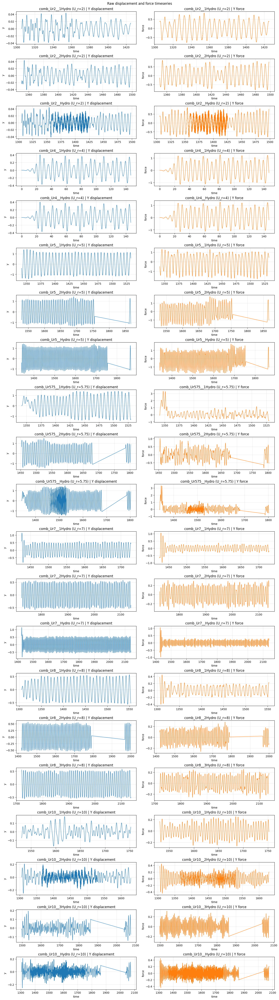

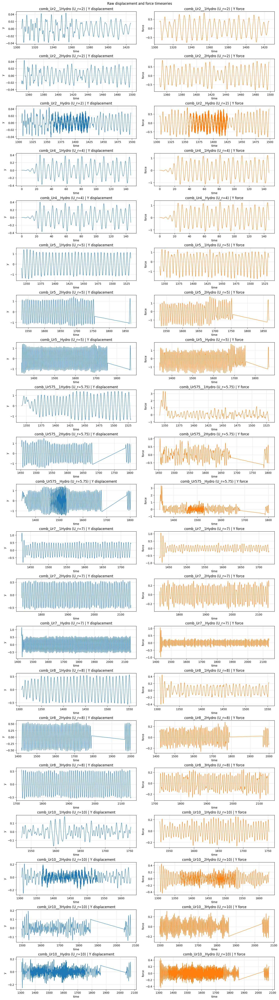

In [3]:
# Raw displacement and force timeseries for all identified cases
RAW_CASES_MAX = None           # None -> all records
RAW_CASES_SORT_BY = "ur"      # "ur" or "name"
RAW_CASES_FIGWIDTH = 14
RAW_CASES_ROWHEIGHT = 2.4

plot_timeseries_grid(
    records,
    sort_by=RAW_CASES_SORT_BY,
    max_cases=RAW_CASES_MAX,
    figwidth=RAW_CASES_FIGWIDTH,
    rowheight=RAW_CASES_ROWHEIGHT,
    figure_title="Raw displacement and force timeseries",
)


In [4]:
# Cleaning manifest table
CLEANING_MANIFEST_PATH = OUTPUT_DIR / "cleaning_manifest.csv"

manifest_df = build_cleaning_manifest(records, CLEANING_MANIFEST_PATH)
print(f"Cleaning manifest: {CLEANING_MANIFEST_PATH.resolve()}")
print("Edit action/start_time/end_time/notes in the CSV, then rerun this cell and the cleaned plot cell.")
manifest_df


Cleaning manifest: /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/outputs/analysis/cleaning_manifest.csv
Edit action/start_time/end_time/notes in the CSV, then rerun this cell and the cleaned plot cell.


,case_name,path,ur_value,action,start_time,end_time,full_start_time,full_end_time,duration_s,num_rows,notes
0,comb_Ur2__1Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,2.00,keep,NaN,NaN,1305.457,1425.145,119.688,20428,NaN
1,comb_Ur2__2Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,2.00,keep,NaN,NaN,1350.457,1498.273,147.816,24662,NaN
2,comb_Ur2__Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,2.00,drop,NaN,NaN,1305.457,1498.273,192.816,45090,NaN
3,comb_Ur4__1Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,4.00,drop,NaN,NaN,0.006,146.658,146.652,24443,NaN
4,comb_Ur4__Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,4.00,trim,20.000,146.658,0.006,146.658,146.652,24443,NaN
5,comb_Ur5__1Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,5.00,keep,NaN,NaN,1341.459,1532.459,191.000,23901,NaN
6,comb_Ur5__2Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,5.00,trim,1529.459,1750.000,1529.459,1866.939,337.480,28931,NaN
7,comb_Ur5__Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,5.00,drop,NaN,NaN,1341.459,1866.939,525.480,52832,NaN
8,comb_Ur575__1Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,5.75,trim,1375.000,1529.635,1341.459,1529.635,188.176,23673,NaN
9,comb_Ur575__2Hydro,/Users/kasperslagstad/Desktop/Masterproject/CF...,5.75,trim,1453.459,1675.000,1453.459,1802.763,349.304,30466,NaN


Kept 14 of 21 records after applying the manifest.


,case_name,action_applied,num_rows_after,start_time_after,end_time_after
0,comb_Ur10__1Hydro,keep,18464,1530.619,1752.175
1,comb_Ur10__2Hydro,drop,0,NaN,NaN
2,comb_Ur10__3Hydro,trim,29379,1497.463,1849.999
3,comb_Ur10__Hydro,drop,0,NaN,NaN
4,comb_Ur2__1Hydro,keep,20428,1305.457,1425.145
5,comb_Ur2__2Hydro,keep,24662,1350.457,1498.273
6,comb_Ur2__Hydro,drop,0,NaN,NaN
7,comb_Ur4__1Hydro,drop,0,NaN,NaN
8,comb_Ur4__Hydro,trim,21110,20.004,146.658
9,comb_Ur5__1Hydro,keep,23901,1341.459,1532.459


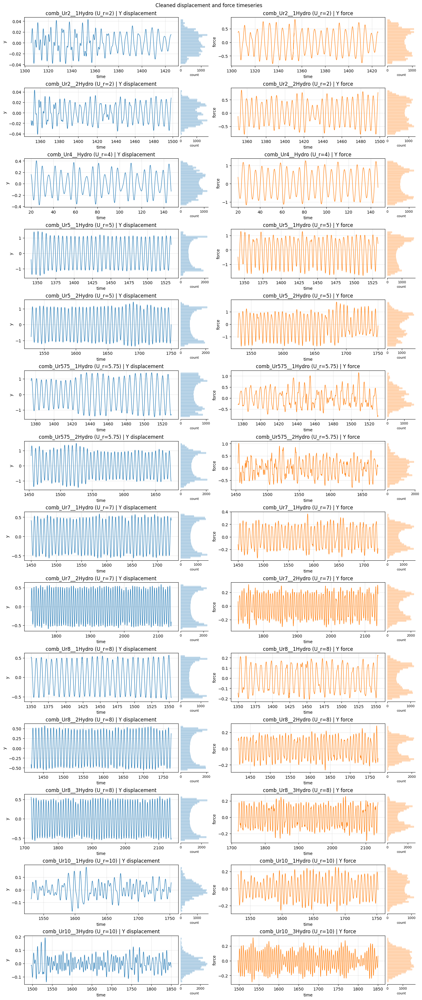

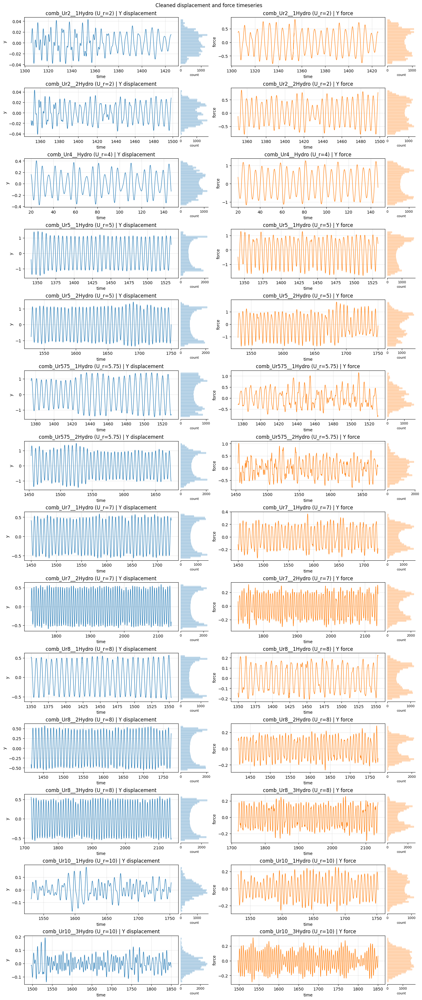

In [5]:
# Cleaned displacement and force timeseries after applying the manifest
CLEANED_CASES_MAX = None           # None -> all kept records
CLEANED_CASES_SORT_BY = "ur"      # "ur" or "name"
CLEANED_CASES_FIGWIDTH = 14
CLEANED_CASES_ROWHEIGHT = 2.4

manifest_df = build_cleaning_manifest(records, CLEANING_MANIFEST_PATH)
cleaned_records, cleaning_applied_df = apply_cleaning_manifest(records, manifest_df)
cleaned_summary_rows = [record_summary(record) for record in cleaned_records]

print(f"Kept {len(cleaned_records)} of {len(records)} records after applying the manifest.")
display(cleaning_applied_df)

plot_timeseries_grid(
    cleaned_records,
    sort_by=CLEANED_CASES_SORT_BY,
    max_cases=CLEANED_CASES_MAX,
    figwidth=CLEANED_CASES_FIGWIDTH,
    rowheight=CLEANED_CASES_ROWHEIGHT,
    figure_title="Cleaned displacement and force timeseries",
    show_side_histogram=True,
)


Removed duplicate timestamps from 5 case(s).


,case_name,ur_value,num_rows_before,duplicate_rows_removed,num_rows_after,has_duplicate_timestamps,first_duplicate_time
0,comb_Ur10__1Hydro,10.00,18464,0,18464,False,NaN
1,comb_Ur10__3Hydro,10.00,29379,0,29379,False,NaN
2,comb_Ur2__1Hydro,2.00,20428,479,19949,True,1350.457
3,comb_Ur2__2Hydro,2.00,24662,25,24637,True,1350.457
4,comb_Ur4__Hydro,4.00,21110,0,21110,False,NaN
5,comb_Ur5__1Hydro,5.00,23901,25,23876,True,1453.459
6,comb_Ur5__2Hydro,5.00,27568,0,27568,False,NaN
7,comb_Ur575__1Hydro,5.75,19480,150,19330,True,1453.459
8,comb_Ur575__2Hydro,5.75,27693,0,27693,False,NaN
9,comb_Ur7__1Hydro,7.00,23151,0,23151,False,NaN


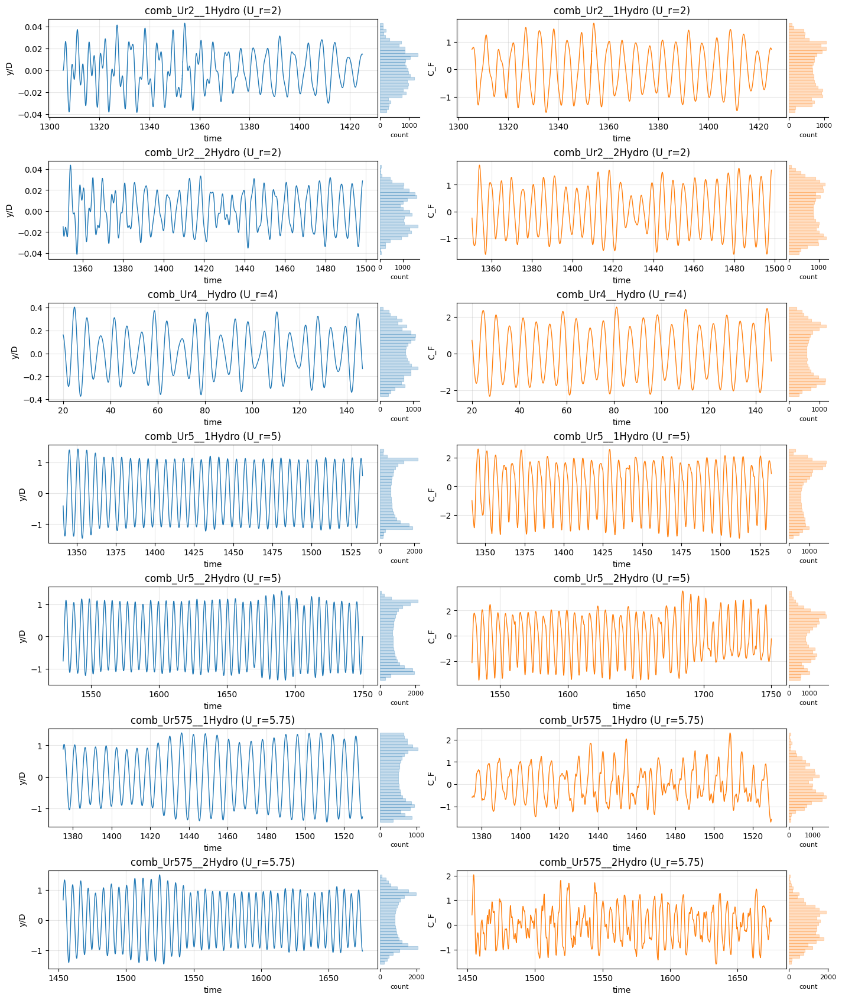

Saved plot to /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_cleaned_deduplicated_timeseries_y_over_d_cf_with_side_histograms_part_01_of_02.pdf and /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_cleaned_deduplicated_timeseries_y_over_d_cf_with_side_histograms_part_01_of_02.png


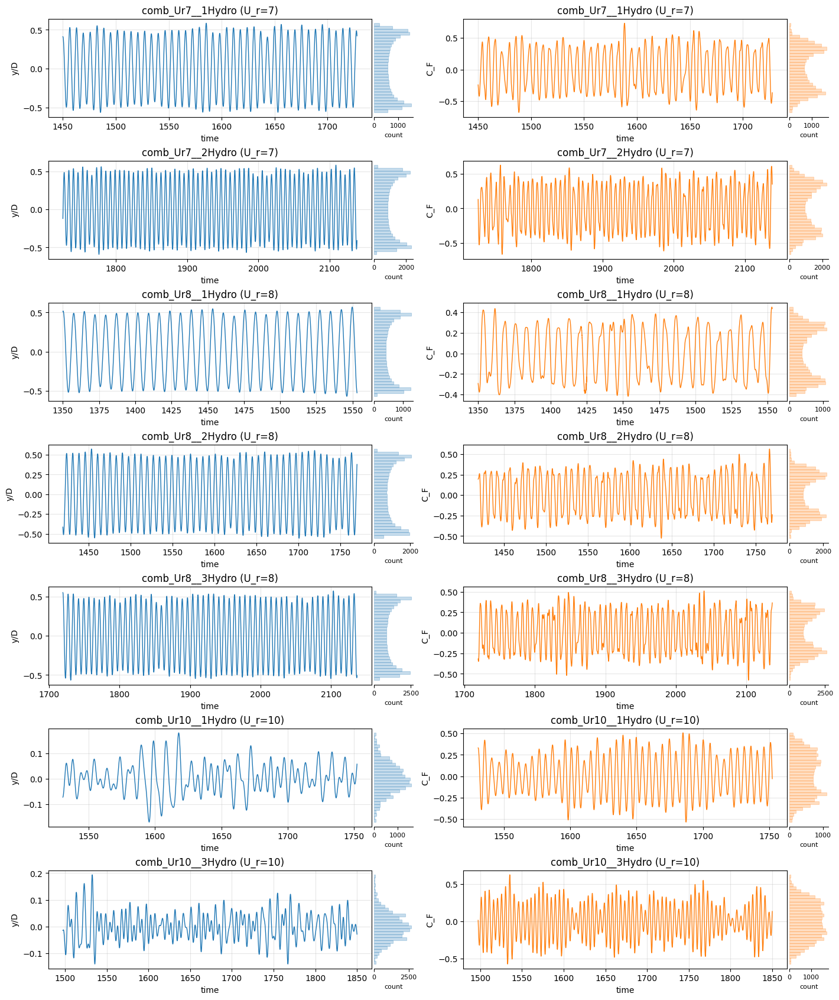

Saved plot to /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_cleaned_deduplicated_timeseries_y_over_d_cf_with_side_histograms_part_02_of_02.pdf and /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_cleaned_deduplicated_timeseries_y_over_d_cf_with_side_histograms_part_02_of_02.png


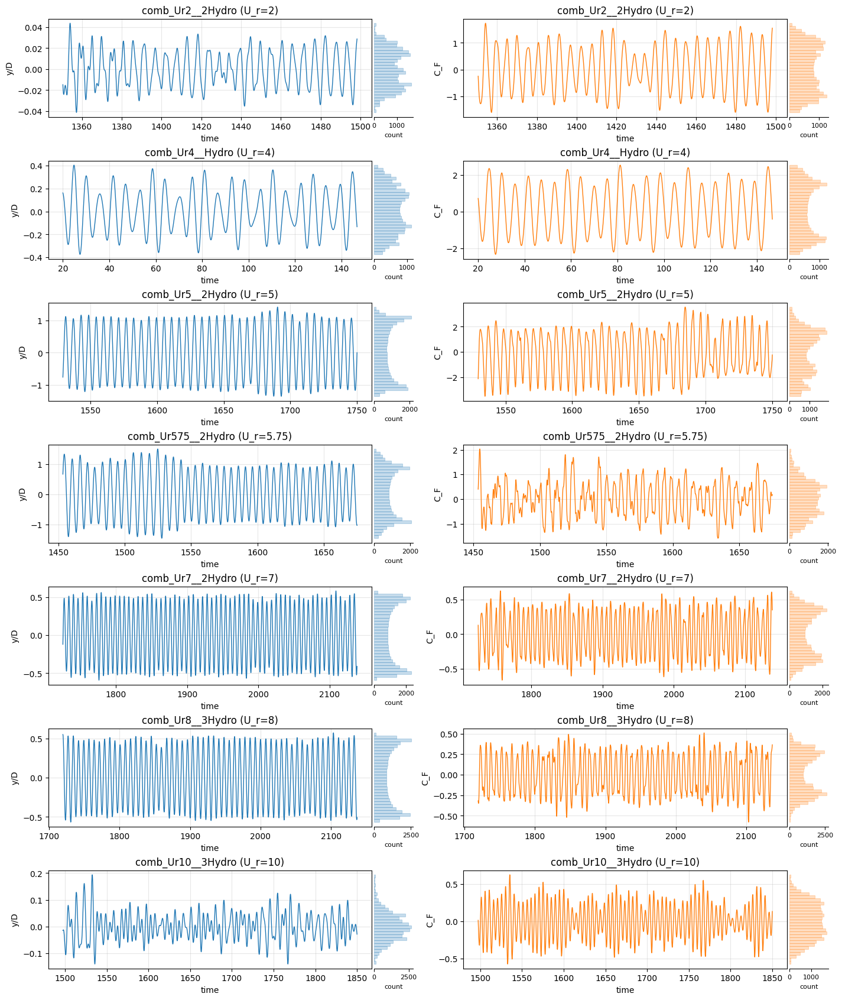

Saved longest-per-U_r plot to /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_cleaned_deduplicated_longest_case_per_ur_y_over_d_cf_with_side_histograms_part_01_of_01.pdf and /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_cleaned_deduplicated_longest_case_per_ur_y_over_d_cf_with_side_histograms_part_01_of_01.png


In [6]:
# Identify and remove duplicate timestamps after manifest cleaning
import importlib
from vivana_cfd_data_pipeline.helpers import cfd_io
importlib.reload(cfd_io)
build_nondim_metadata = cfd_io.build_nondim_metadata
nondimensionalize_records_from_metadata = cfd_io.nondimensionalize_records_from_metadata
remove_duplicate_timestamps = cfd_io.remove_duplicate_timestamps
summarize_duplicate_timestamps = cfd_io.summarize_duplicate_timestamps
plot_timeseries_grid = cfd_io.plot_timeseries_grid
record_summary = cfd_io.record_summary

DEDUP_CASES_MAX = None           # None -> all kept records
DEDUP_CASES_SORT_BY = "ur"      # "ur" or "name"
DEDUP_CASES_PER_FIGURE = 7
DEDUP_CASES_FIGWIDTH = 14
DEDUP_CASES_ROWHEIGHT = 2.4
DEDUP_ND_TIME_SCALE_MODE = "fn"   # "fn" or "k_ref"
DEDUP_ND_REFERENCE_STIFFNESS_N_M = 7.4
DEDUP_PLOTS_DIR = Path("plots")
DEDUP_PLOT_EXPORT_STEM = "cfd_cleaned_deduplicated_timeseries_y_over_d_cf_with_side_histograms"
DEDUP_ONE_PER_UR_EXPORT_STEM = "cfd_cleaned_deduplicated_longest_case_per_ur_y_over_d_cf_with_side_histograms"
DEDUP_ONE_PER_UR_INCLUDE_UNKNOWN = False

duplicate_timestamp_df = summarize_duplicate_timestamps(cleaned_records)
cleaned_records_dedup, duplicate_timestamp_applied_df = remove_duplicate_timestamps(cleaned_records)
cleaned_dedup_summary_rows = [record_summary(record) for record in cleaned_records_dedup]

print(f"Removed duplicate timestamps from {int(duplicate_timestamp_df['has_duplicate_timestamps'].sum())} case(s).")
display(duplicate_timestamp_applied_df)

if DEDUP_ND_TIME_SCALE_MODE == "fn":
    DEDUP_ND_TIME_LABEL = "time"
elif DEDUP_ND_TIME_SCALE_MODE == "k_ref":
    DEDUP_ND_TIME_LABEL = "time"
else:
    raise ValueError("DEDUP_ND_TIME_SCALE_MODE must be 'fn' or 'k_ref'.")

def select_longest_record_per_ur(records, *, include_unknown=False):
    longest_by_ur = {}
    for record in records:
        if record.ur_value is None:
            if not include_unknown:
                continue
            ur_key = float("inf")
        else:
            ur_key = float(record.ur_value)
        duration = float(record.time[-1] - record.time[0])
        candidate_key = (duration, int(record.data.shape[0]), record.case_name)
        current = longest_by_ur.get(ur_key)
        if current is None or candidate_key > current[0]:
            longest_by_ur[ur_key] = (candidate_key, record)
    return [item[1] for item in sorted(longest_by_ur.values(), key=lambda item: (item[1].ur_value is None, float("inf") if item[1].ur_value is None else float(item[1].ur_value), item[1].case_name))]

dedup_nondim_metadata_df = nondim_metadata_df if "nondim_metadata_df" in globals() else build_nondim_metadata(
    cleaned_records_dedup,
    OUTPUT_DIR / "CFD_metadata.csv",
    flow_speed_m_s=None,
    diameter_m=1.0,
    structural_frequency_hz=None,
    rho_kg_m3=1.0,
    span_m=4.0,
)

try:
    # Keep dimensional time for the detailed timeseries plots.
    cleaned_records_dedup_nondim = nondimensionalize_records_from_metadata(
        cleaned_records_dedup,
        dedup_nondim_metadata_df,
        time_scale_mode=DEDUP_ND_TIME_SCALE_MODE,
        reference_stiffness_n_m=DEDUP_ND_REFERENCE_STIFFNESS_N_M,
        preserve_dimensional_time=True,
    )
    # Build a true nondimensional-time copy for summary metrics such as omega/omega_n.
    nondim_records = nondimensionalize_records_from_metadata(
        cleaned_records_dedup,
        dedup_nondim_metadata_df,
        time_scale_mode=DEDUP_ND_TIME_SCALE_MODE,
        reference_stiffness_n_m=DEDUP_ND_REFERENCE_STIFFNESS_N_M,
        preserve_dimensional_time=False,
    )
    DEDUP_PLOTS_DIR.mkdir(parents=True, exist_ok=True)
    if DEDUP_CASES_SORT_BY == "ur":
        cleaned_records_dedup_nondim = sorted(
            cleaned_records_dedup_nondim,
            key=lambda rec: (
                float("inf") if rec.ur_value is None else float(rec.ur_value),
                rec.case_name,
            ),
        )
        nondim_records = sorted(
            nondim_records,
            key=lambda rec: (
                float("inf") if rec.ur_value is None else float(rec.ur_value),
                rec.case_name,
            ),
        )
    else:
        cleaned_records_dedup_nondim = sorted(cleaned_records_dedup_nondim, key=lambda rec: rec.case_name)
        nondim_records = sorted(nondim_records, key=lambda rec: rec.case_name)

    if DEDUP_CASES_MAX is not None:
        cleaned_records_dedup_nondim = cleaned_records_dedup_nondim[: int(DEDUP_CASES_MAX)]
        nondim_records = nondim_records[: int(DEDUP_CASES_MAX)]

    nondim_summary_rows = [record_summary(record) for record in nondim_records]

    dedup_record_chunks = [
        cleaned_records_dedup_nondim[idx: idx + DEDUP_CASES_PER_FIGURE]
        for idx in range(0, len(cleaned_records_dedup_nondim), DEDUP_CASES_PER_FIGURE)
    ]
    dedup_num_chunks = len(dedup_record_chunks)

    for dedup_chunk_idx, dedup_record_chunk in enumerate(dedup_record_chunks, start=1):
        dedup_plot_fig = plot_timeseries_grid(
            dedup_record_chunk,
            sort_by=DEDUP_CASES_SORT_BY,
            max_cases=None,
            figwidth=DEDUP_CASES_FIGWIDTH,
            rowheight=DEDUP_CASES_ROWHEIGHT,
            figure_title=None,
            nondimensionalized=True,
            nondim_time_label=DEDUP_ND_TIME_LABEL,
            compact_titles=True,
            show_side_histogram=True,
            histogram_size="12%",
            histogram_pad=0.04,
        )
        if dedup_plot_fig is not None:
            dedup_plot_part_stem = (
                f"{DEDUP_PLOT_EXPORT_STEM}_part_{dedup_chunk_idx:02d}_of_{dedup_num_chunks:02d}"
            )
            dedup_plot_pdf_path = DEDUP_PLOTS_DIR / f"{dedup_plot_part_stem}.pdf"
            dedup_plot_png_path = DEDUP_PLOTS_DIR / f"{dedup_plot_part_stem}.png"
            dedup_plot_fig.savefig(dedup_plot_pdf_path, bbox_inches="tight")
            dedup_plot_fig.savefig(dedup_plot_png_path, dpi=400, bbox_inches="tight")
            print(f"Saved plot to {dedup_plot_pdf_path.resolve()} and {dedup_plot_png_path.resolve()}")
            plt.close(dedup_plot_fig)

    dedup_longest_per_ur_records = select_longest_record_per_ur(
        cleaned_records_dedup_nondim,
        include_unknown=DEDUP_ONE_PER_UR_INCLUDE_UNKNOWN,
    )
    dedup_longest_per_ur_chunks = [
        dedup_longest_per_ur_records[idx: idx + DEDUP_CASES_PER_FIGURE]
        for idx in range(0, len(dedup_longest_per_ur_records), DEDUP_CASES_PER_FIGURE)
    ]
    dedup_longest_per_ur_num_chunks = len(dedup_longest_per_ur_chunks)

    for dedup_chunk_idx, dedup_record_chunk in enumerate(dedup_longest_per_ur_chunks, start=1):
        dedup_plot_fig = plot_timeseries_grid(
            dedup_record_chunk,
            sort_by="ur",
            max_cases=None,
            figwidth=DEDUP_CASES_FIGWIDTH,
            rowheight=DEDUP_CASES_ROWHEIGHT,
            figure_title=None,
            nondimensionalized=True,
            nondim_time_label=DEDUP_ND_TIME_LABEL,
            compact_titles=True,
            show_side_histogram=True,
            histogram_size="12%",
            histogram_pad=0.04,
        )
        if dedup_plot_fig is not None:
            dedup_plot_part_stem = (
                f"{DEDUP_ONE_PER_UR_EXPORT_STEM}_part_{dedup_chunk_idx:02d}_of_{dedup_longest_per_ur_num_chunks:02d}"
            )
            dedup_plot_pdf_path = DEDUP_PLOTS_DIR / f"{dedup_plot_part_stem}.pdf"
            dedup_plot_png_path = DEDUP_PLOTS_DIR / f"{dedup_plot_part_stem}.png"
            dedup_plot_fig.savefig(dedup_plot_pdf_path, bbox_inches="tight")
            dedup_plot_fig.savefig(dedup_plot_png_path, dpi=400, bbox_inches="tight")
            print(f"Saved longest-per-U_r plot to {dedup_plot_pdf_path.resolve()} and {dedup_plot_png_path.resolve()}")
            plt.close(dedup_plot_fig)
except ValueError as exc:
    cleaned_records_dedup_nondim = []
    nondim_records = []
    nondim_summary_rows = []
    print(f"Fill flow_speed_m_s and frequency metadata for each case in {OUTPUT_DIR / 'CFD_metadata.csv'}, then rerun this cell: {exc}")


In [7]:
# Cleaned timeseries per-case stats table
import importlib
from vivana_cfd_data_pipeline.helpers import cfd_io
importlib.reload(cfd_io)
resolve_structural_frequency_hz = cfd_io.resolve_structural_frequency_hz
resolve_stiffness_n_m = cfd_io.resolve_stiffness_n_m

stats_metadata_path = OUTPUT_DIR / "CFD_metadata.csv"
stats_time_scale_mode = globals().get("ND_TIME_SCALE_MODE", "k_ref")
stats_reference_stiffness_n_m = globals().get("ND_REFERENCE_STIFFNESS_N_M", 7.4)
stats_metadata_map = None
if stats_metadata_path.exists():
    stats_metadata_df = pd.read_csv(stats_metadata_path)
    if "case_name" in stats_metadata_df.columns:
        stats_metadata_map = stats_metadata_df.set_index("case_name").to_dict(orient="index")

CLEANED_STATS_COLUMNS = [
    "case_name",
    "ur_value",
    "num_rows",
    "dt",
    "dt_nondim",
    "structural_frequency_hz",
    "steps_per_cycle_est",
    "duration_s",
    "estimated_cycles",
    "x_disp_mean",
    "x_disp_std",
    "y_disp_mean",
    "y_disp_std",
    "x_vel_mean",
    "x_vel_std",
    "y_vel_mean",
    "y_vel_std",
    "x_acc_mean",
    "x_acc_std",
    "y_acc_mean",
    "y_acc_std",
    "x_force_mean",
    "x_force_std",
    "y_force_mean",
    "y_force_std",
]

records_for_stats = cleaned_records_dedup if "cleaned_records_dedup" in globals() else cleaned_records

cleaned_stats_rows = []
for record in sorted(
    records_for_stats,
    key=lambda rec: (
        float("inf") if rec.ur_value is None else float(rec.ur_value),
        rec.case_name,
    ),
):
    time = record.time
    dt = float(np.median(np.diff(time))) if time.size > 1 else float("nan")
    dt_nondim = float("nan")
    structural_frequency_hz = float("nan")
    steps_per_cycle_est = float("nan")
    duration_s = float(time[-1] - time[0]) if time.size > 1 else 0.0
    estimated_cycles = float("nan")
    if stats_metadata_map is not None:
        meta = stats_metadata_map.get(record.case_name)
        if meta is not None and np.isfinite(dt) and dt > 0.0:
            try:
                structural_frequency_hz = resolve_structural_frequency_hz(meta, record.case_name)
                if stats_time_scale_mode == "fn":
                    time_scale_factor = float(2.0 * np.pi * structural_frequency_hz)
                    dt_nondim = float(dt * time_scale_factor)
                    if np.isfinite(dt_nondim) and dt_nondim > 0.0:
                        steps_per_cycle_est = float(2.0 * np.pi / dt_nondim)
                elif stats_time_scale_mode == "k_ref":
                    stiffness_n_m = resolve_stiffness_n_m(meta, record.case_name, structural_frequency_hz=structural_frequency_hz)
                    time_scale_factor = float(np.sqrt(stiffness_n_m / stats_reference_stiffness_n_m))
                    dt_nondim = float(dt * time_scale_factor)
                    if np.isfinite(dt_nondim) and dt_nondim > 0.0:
                        steps_per_cycle_est = float(2.0 * np.pi / dt_nondim)
            except Exception:
                pass
    if np.isfinite(structural_frequency_hz):
        estimated_cycles = float(duration_s * structural_frequency_hz)
    cleaned_stats_rows.append(
        {
            "case_name": record.case_name,
            "ur_value": float(record.ur_value) if record.ur_value is not None else np.nan,
            "num_rows": int(record.data.shape[0]),
            "dt": dt,
            "dt_nondim": dt_nondim,
            "structural_frequency_hz": structural_frequency_hz,
            "steps_per_cycle_est": steps_per_cycle_est,
            "duration_s": duration_s,
            "estimated_cycles": estimated_cycles,
            "x_disp_mean": float(np.mean(record.data[:, 1])),
            "x_disp_std": float(np.std(record.data[:, 1])),
            "y_disp_mean": float(np.mean(record.data[:, 2])),
            "y_disp_std": float(np.std(record.data[:, 2])),
            "x_vel_mean": float(np.mean(record.data[:, 3])),
            "x_vel_std": float(np.std(record.data[:, 3])),
            "y_vel_mean": float(np.mean(record.data[:, 4])),
            "y_vel_std": float(np.std(record.data[:, 4])),
            "x_acc_mean": float(np.mean(record.data[:, 5])),
            "x_acc_std": float(np.std(record.data[:, 5])),
            "y_acc_mean": float(np.mean(record.data[:, 6])),
            "y_acc_std": float(np.std(record.data[:, 6])),
            "x_force_mean": float(np.mean(record.data[:, 7])),
            "x_force_std": float(np.std(record.data[:, 7])),
            "y_force_mean": float(np.mean(record.data[:, 8])),
            "y_force_std": float(np.std(record.data[:, 8])),
        }
    )

cleaned_stats_df = pd.DataFrame(cleaned_stats_rows)
display(cleaned_stats_df[CLEANED_STATS_COLUMNS])


,case_name,ur_value,num_rows,dt,dt_nondim,structural_frequency_hz,steps_per_cycle_est,duration_s,estimated_cycles,x_disp_mean,...,y_vel_mean,y_vel_std,x_acc_mean,x_acc_std,y_acc_mean,y_acc_std,x_force_mean,x_force_std,y_force_mean,y_force_std
0,comb_Ur2__1Hydro,2.00,19949,0.006,0.024004,0.445150,261.755176,119.688,53.279115,0.0,...,0.000128,0.028326,0.0,0.0,-0.000027,0.063698,0.675141,0.043201,0.000724,0.409533
1,comb_Ur2__2Hydro,2.00,24637,0.006,0.024004,0.445150,261.755176,147.816,65.800295,0.0,...,0.000294,0.023628,0.0,0.0,0.000412,0.043593,0.685686,0.049163,-0.001134,0.428987
2,comb_Ur4__Hydro,4.00,21110,0.006,0.012002,0.222575,523.510352,126.654,28.190015,0.0,...,-0.002335,0.218673,0.0,0.0,-0.001428,0.257643,0.802736,0.112594,0.018303,0.676687
3,comb_Ur5__1Hydro,5.00,23876,0.008,0.012802,0.178058,490.796135,191.000,34.009102,0.0,...,0.005045,0.910320,0.0,0.0,0.001881,1.023954,1.536688,0.800855,-0.083483,0.859666
4,comb_Ur5__2Hydro,5.00,27568,0.008,0.012802,0.178058,490.796135,220.536,39.268227,0.0,...,0.003500,0.908028,0.0,0.0,0.002155,1.014413,1.545609,0.788256,-0.074734,0.864542
5,comb_Ur575__1Hydro,5.75,19330,0.008,0.011133,0.154839,564.394335,154.632,23.943060,0.0,...,-0.013882,0.904422,0.0,0.0,-0.001315,0.976776,1.725569,0.529395,0.006796,0.376293
6,comb_Ur575__2Hydro,5.75,27693,0.008,0.011133,0.154839,564.394335,221.536,34.302407,0.0,...,-0.007610,0.848381,0.0,0.0,-0.005063,0.950665,1.640857,0.508305,-0.000626,0.353024
7,comb_Ur7__1Hydro,7.00,23151,0.012,0.013718,0.127195,458.037721,277.800,35.334803,0.0,...,0.000032,0.347656,0.0,0.0,-0.000939,0.339978,0.694546,0.082027,-0.000024,0.164168
8,comb_Ur7__2Hydro,7.00,34417,0.012,0.013718,0.127195,458.037721,412.992,52.530565,0.0,...,-0.000692,0.352796,0.0,0.0,-0.000390,0.343795,0.697080,0.082699,-0.000198,0.161289
9,comb_Ur8__1Hydro,8.00,16926,0.012,0.012000,0.111269,523.598776,203.100,22.598675,0.0,...,-0.005105,0.306220,0.0,0.0,-0.000959,0.260559,0.611198,0.048181,-0.001886,0.120234


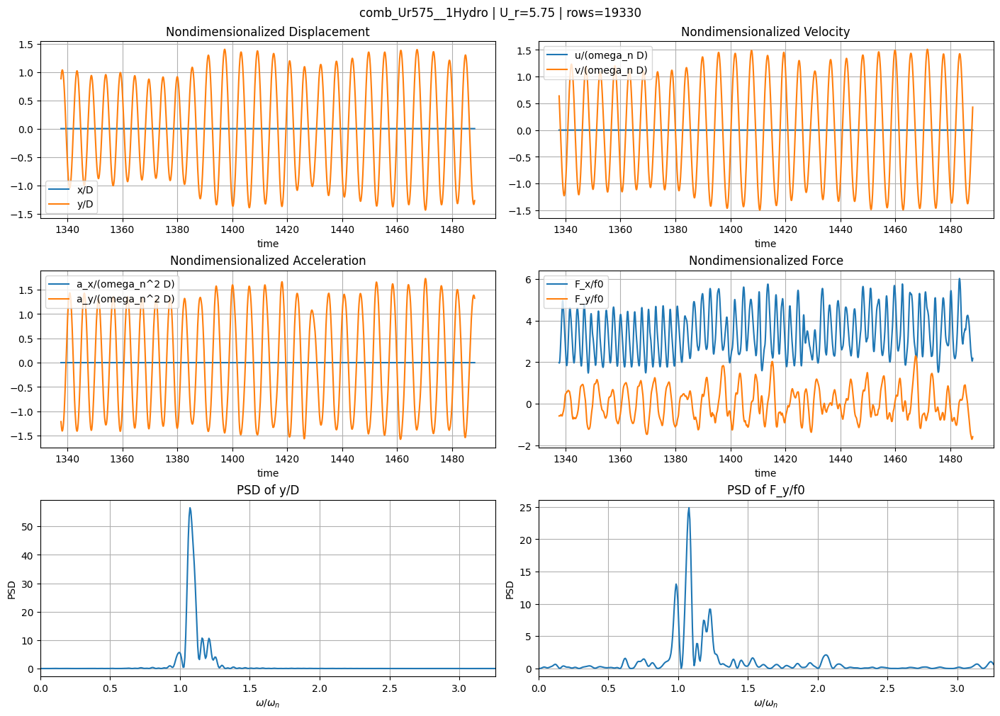

In [8]:
# Per-case plot controls
import importlib
from vivana_cfd_data_pipeline.helpers import cfd_io
importlib.reload(cfd_io)
plot_case = cfd_io.plot_case

ND_TIME_SCALE_MODE = globals().get("ND_TIME_SCALE_MODE", globals().get("DEDUP_ND_TIME_SCALE_MODE", "fn"))
ND_TIME_LABEL = globals().get("ND_TIME_LABEL", globals().get("DEDUP_ND_TIME_LABEL", "time"))
ND_FREQ_LABEL = globals().get(
    "ND_FREQ_LABEL",
    (r"$\omega / \omega_n$" if ND_TIME_SCALE_MODE == "fn" else "Scaled frequency [-]"),
)

CASE_SOURCE = "nondim"        # "raw", "cleaned", or "nondim"
CASE_INDEX = 5
CASE_PSD_METHOD = "welch"      # "welch" or "fft"
CASE_PSD_NPERSEG = None         # None -> full signal length
CASE_PSD_NFFT_FACTOR = 4        # zero-padding for smoother display
CASE_PSD_FREQ_MULTIPLIER = 3.0
CASE_PSD_MIN_FMAX_HZ = 0.25
CASE_FIGSIZE = (14, 10)

if CASE_SOURCE == "nondim" and "nondim_records" in globals():
    case_records = nondim_records
elif CASE_SOURCE == "cleaned" and "cleaned_records" in globals():
    case_records = cleaned_records
else:
    case_records = records

if case_records:
    plot_case(
        case_records[CASE_INDEX],
        output_dir=None,
        psd_method=CASE_PSD_METHOD,
        psd_nperseg=CASE_PSD_NPERSEG,
        psd_nfft_factor=CASE_PSD_NFFT_FACTOR,
        psd_freq_multiplier=CASE_PSD_FREQ_MULTIPLIER,
        psd_min_fmax_hz=CASE_PSD_MIN_FMAX_HZ,
        figsize=CASE_FIGSIZE,
        nondimensionalized=(CASE_SOURCE == "nondim"),
        nondim_time_label=(ND_TIME_LABEL if CASE_SOURCE == "nondim" else r"$\tau = \omega_n t$"),
        nondim_freq_label=(ND_FREQ_LABEL if CASE_SOURCE == "nondim" else r"$\omega / \omega_n$"),
        nondim_freq_scale_factor=(2.0 * np.pi if CASE_SOURCE == "nondim" and ND_TIME_SCALE_MODE == "fn" else 1.0),
    )


Saved combined summary plot to /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_summary_vs_reduced_velocity_combined.pdf and /Users/kasperslagstad/Desktop/Masterproject/vivana_cfd_data_pipeline/plots/cfd_summary_vs_reduced_velocity_combined.png


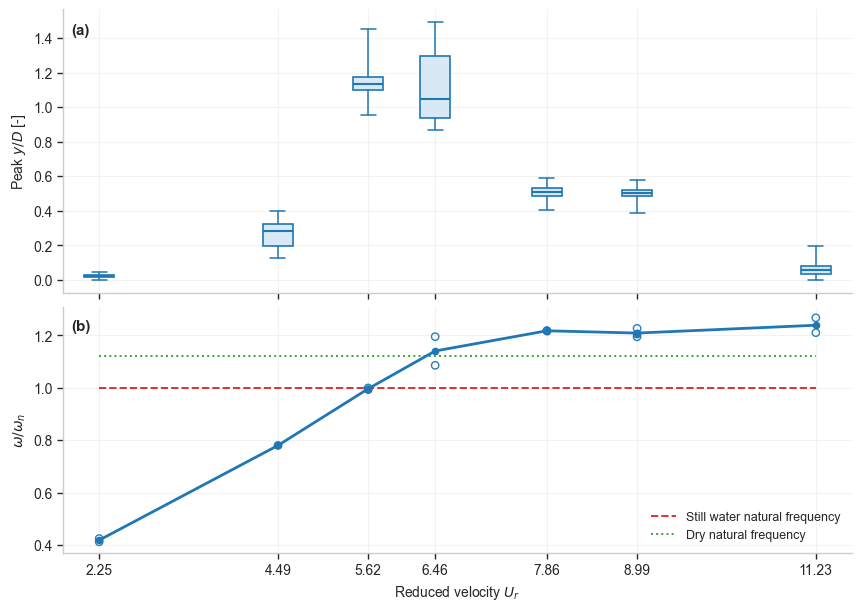

In [9]:
# Combined summary and peak-amplitude plot controls
from pathlib import Path
import importlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from vivana_cfd_data_pipeline.helpers import cfd_io
importlib.reload(cfd_io)
displacement_peak_amplitudes = cfd_io.displacement_peak_amplitudes
resolve_computed_ur_value = cfd_io.resolve_computed_ur_value
resolve_structural_frequency_hz = cfd_io.resolve_structural_frequency_hz
resolve_dry_structural_frequency_hz = cfd_io.resolve_dry_structural_frequency_hz
resolve_stiffness_n_m = cfd_io.resolve_stiffness_n_m

ND_TIME_SCALE_MODE = globals().get("ND_TIME_SCALE_MODE", globals().get("DEDUP_ND_TIME_SCALE_MODE", "fn"))
ND_REFERENCE_STIFFNESS_N_M = globals().get(
    "ND_REFERENCE_STIFFNESS_N_M",
    globals().get("DEDUP_ND_REFERENCE_STIFFNESS_N_M", 7.4),
)
ND_SUMMARY_FREQ_YLABEL = globals().get(
    "ND_SUMMARY_FREQ_YLABEL",
    (r"$\omega / \omega_n$" if ND_TIME_SCALE_MODE == "fn" else "Scaled frequency [-]"),
)

SUMMARY_SOURCE = "nondim"          # "raw", "cleaned", or "nondim"
SUMMARY_UR_SOURCE = "computed"     # "label" or "computed"
SUMMARY_FIGSIZE = (8.5, 6.0)
SUMMARY_SAVE_PLOT = True
SUMMARY_PNG_DPI = 400
SUMMARY_PLOTS_DIR = Path("plots")
SUMMARY_EXPORT_STEM = "cfd_summary_vs_reduced_velocity_combined"
SUMMARY_CFD_COLOR = "#1f77b4"

if SUMMARY_SOURCE == "nondim" and "nondim_summary_rows" in globals():
    summary_source_rows = nondim_summary_rows
elif SUMMARY_SOURCE == "cleaned" and "cleaned_summary_rows" in globals():
    summary_source_rows = cleaned_summary_rows
else:
    summary_source_rows = summary_rows

if SUMMARY_SOURCE == "nondim" and "nondim_records" in globals():
    summary_source_records = nondim_records
elif SUMMARY_SOURCE == "cleaned" and "cleaned_records" in globals():
    summary_source_records = cleaned_records
else:
    summary_source_records = records

summary_metadata_map = None
if "nondim_metadata_df" in globals():
    summary_metadata_map = nondim_metadata_df.set_index("case_name").to_dict(orient="index")
else:
    summary_metadata_path = OUTPUT_DIR / "CFD_metadata.csv"
    if summary_metadata_path.exists():
        summary_metadata_df = pd.read_csv(summary_metadata_path)
        if "case_name" in summary_metadata_df.columns:
            summary_metadata_map = summary_metadata_df.set_index("case_name").to_dict(orient="index")

SUMMARY_UR_DECIMALS = 2

def resolve_plot_ur(case_name, fallback_ur=np.nan):
    if SUMMARY_UR_SOURCE == "computed":
        if summary_metadata_map is None:
            return np.nan
        meta = summary_metadata_map.get(str(case_name))
        if meta is None:
            return np.nan
        try:
            return round(float(resolve_computed_ur_value(meta, str(case_name))), SUMMARY_UR_DECIMALS)
        except Exception:
            return np.nan
    if fallback_ur is None:
        return np.nan
    try:
        ur = float(fallback_ur)
    except Exception:
        return np.nan
    return round(ur, SUMMARY_UR_DECIMALS) if np.isfinite(ur) else np.nan

summary_points = []
for row in summary_source_rows:
    plot_ur = resolve_plot_ur(row["case_name"], row.get("ur_value", np.nan))
    if np.isfinite(plot_ur):
        summary_points.append((float(plot_ur), row))
summary_points = sorted(summary_points, key=lambda item: (item[0], str(item[1]["case_name"])))
if not summary_points:
    raise ValueError("No finite reduced-velocity values available for the combined summary plot.")

summary_x_values = np.asarray([item[0] for item in summary_points], dtype=float)
summary_x_label = "Reduced velocity $U_r$"
dominant_freq = np.asarray([float(item[1]["dominant_freq_y_disp_hz"]) for item in summary_points], dtype=float)

def group_means_by_ur(x_values, y_values):
    grouped = {}
    for x_val, y_val in zip(np.asarray(x_values, dtype=float), np.asarray(y_values, dtype=float)):
        if not (np.isfinite(x_val) and np.isfinite(y_val)):
            continue
        grouped.setdefault(float(x_val), []).append(float(y_val))
    grouped_x = np.asarray(sorted(grouped.keys()), dtype=float)
    grouped_mean = np.asarray([float(np.mean(grouped[x_val])) for x_val in grouped_x], dtype=float) if grouped_x.size > 0 else np.asarray([], dtype=float)
    return grouped_x, grouped_mean

dominant_freq_mean_x, dominant_freq_mean_y = group_means_by_ur(summary_x_values, dominant_freq)
nondim_freq_scale_factor = 2.0 * np.pi if SUMMARY_SOURCE == "nondim" and ND_TIME_SCALE_MODE == "fn" else 1.0
if SUMMARY_SOURCE == "nondim":
    dominant_freq = dominant_freq * float(nondim_freq_scale_factor)
    dominant_freq_mean_x, dominant_freq_mean_y = group_means_by_ur(summary_x_values, dominant_freq)

freq_reference_series = []
if SUMMARY_SOURCE == "nondim" and summary_metadata_map is not None:
    wet_vals = []
    dry_vals = []
    for _, row in summary_points:
        meta = summary_metadata_map.get(str(row["case_name"]))
        if meta is None:
            wet_vals.append(np.nan)
            dry_vals.append(np.nan)
            continue
        try:
            structural_frequency_hz = resolve_structural_frequency_hz(meta, str(row["case_name"]))
            if ND_TIME_SCALE_MODE == "fn":
                time_scale_factor = float(2.0 * np.pi * structural_frequency_hz)
            else:
                stiffness_n_m = resolve_stiffness_n_m(meta, str(row["case_name"]), structural_frequency_hz=structural_frequency_hz)
                time_scale_factor = float(np.sqrt(stiffness_n_m / ND_REFERENCE_STIFFNESS_N_M))
            wet_vals.append(float((2.0 * np.pi * structural_frequency_hz) / time_scale_factor) if ND_TIME_SCALE_MODE == "fn" else float(structural_frequency_hz / time_scale_factor))
        except Exception:
            wet_vals.append(np.nan)
        try:
            dry_frequency_hz = resolve_dry_structural_frequency_hz(meta, str(row["case_name"]))
            if ND_TIME_SCALE_MODE == "fn":
                wet_frequency_hz = resolve_structural_frequency_hz(meta, str(row["case_name"]))
                time_scale_factor = float(2.0 * np.pi * wet_frequency_hz)
            else:
                stiffness_n_m = resolve_stiffness_n_m(meta, str(row["case_name"]))
                time_scale_factor = float(np.sqrt(stiffness_n_m / ND_REFERENCE_STIFFNESS_N_M))
            dry_vals.append(float((2.0 * np.pi * dry_frequency_hz) / time_scale_factor) if ND_TIME_SCALE_MODE == "fn" else float(dry_frequency_hz / time_scale_factor))
        except Exception:
            dry_vals.append(np.nan)
    wet_ref_x, wet_ref_y = group_means_by_ur(summary_x_values, np.asarray(wet_vals, dtype=float))
    dry_ref_x, dry_ref_y = group_means_by_ur(summary_x_values, np.asarray(dry_vals, dtype=float))
    freq_reference_series = [
        {"x": wet_ref_x, "y": wet_ref_y, "label": "Still water natural frequency", "color": "tab:red", "linestyle": "--"},
        {"x": dry_ref_x, "y": dry_ref_y, "label": "Dry natural frequency", "color": "tab:green", "linestyle": ":"},
    ]

amp_groups = {}
for record in summary_source_records:
    plot_ur = resolve_plot_ur(record.case_name, record.ur_value)
    if not np.isfinite(plot_ur):
        continue
    peaks = displacement_peak_amplitudes(record.y_disp)
    finite_peaks = peaks[np.isfinite(peaks)]
    if finite_peaks.size > 0:
        amp_groups.setdefault(float(plot_ur), []).extend(finite_peaks.tolist())
grouped_urs = sorted(amp_groups)
grouped_vals = [amp_groups[ur] for ur in grouped_urs]

box_width = 0.3
if len(grouped_urs) >= 2:
    min_spacing = float(np.min(np.diff(np.asarray(grouped_urs, dtype=float))))
    if np.isfinite(min_spacing) and min_spacing > 0.0:
        box_width = 0.45 * min_spacing

plt.style.use("seaborn-v0_8-whitegrid")
fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=SUMMARY_FIGSIZE,
    sharex=True,
    constrained_layout=True,
    gridspec_kw={"height_ratios": [1.15, 1.0]},
)

summary_freq_ylabel = ND_SUMMARY_FREQ_YLABEL if SUMMARY_SOURCE == "nondim" else "Dominant frequency [Hz]"
if SUMMARY_SOURCE == "nondim" and isinstance(summary_freq_ylabel, str) and "omega" in summary_freq_ylabel:
    summary_freq_ylabel = r"$\omega / \omega_n$"

panel_labels = ["(a)", "(b)"]

amp_ax = axes[0]
amp_ax.text(0.01, 0.95, panel_labels[0], transform=amp_ax.transAxes, va="top", ha="left", fontsize=11, fontweight="bold")
if grouped_urs:
    amp_box = amp_ax.boxplot(
        grouped_vals,
        positions=np.asarray(grouped_urs, dtype=float),
        widths=box_width,
        whis=(0, 100),
        showmeans=False,
        patch_artist=True,
        medianprops={"color": SUMMARY_CFD_COLOR, "linewidth": 1.5},
        boxprops={"facecolor": "#d9e8f5", "edgecolor": SUMMARY_CFD_COLOR, "linewidth": 1.2},
        whiskerprops={"color": SUMMARY_CFD_COLOR, "linewidth": 1.1},
        capprops={"color": SUMMARY_CFD_COLOR, "linewidth": 1.1},
        flierprops={"marker": ".", "markersize": 2.0, "markerfacecolor": SUMMARY_CFD_COLOR, "markeredgecolor": SUMMARY_CFD_COLOR, "alpha": 0.35},
    )
amp_ax.set_ylabel("Peak $y/D$ [-]" if SUMMARY_SOURCE == "nondim" else "Peak displacement $y$")
amp_ax.grid(True, alpha=0.25)
amp_ax.spines["top"].set_visible(False)
amp_ax.spines["right"].set_visible(False)
amp_ax.tick_params(direction="out", length=4, width=1)

freq_ax = axes[1]
freq_ax.scatter(
    summary_x_values,
    dominant_freq,
    facecolors="none",
    edgecolors=SUMMARY_CFD_COLOR,
    linewidths=1.0,
    s=28,
    zorder=2,
    alpha=0.95,
)
if dominant_freq_mean_x.size > 0:
    freq_ax.plot(dominant_freq_mean_x, dominant_freq_mean_y, color=SUMMARY_CFD_COLOR, linewidth=2.0, marker="o", markersize=4.5, zorder=3)
freq_ax.set_ylabel(summary_freq_ylabel)
freq_ax.text(0.01, 0.95, panel_labels[1], transform=freq_ax.transAxes, va="top", ha="left", fontsize=11, fontweight="bold")
freq_ax.grid(True, alpha=0.25)
freq_ax.spines["top"].set_visible(False)
freq_ax.spines["right"].set_visible(False)
freq_ax.tick_params(direction="out", length=4, width=1)

for series in freq_reference_series:
    ref_x = np.asarray(series["x"], dtype=float)
    ref_y = np.asarray(series["y"], dtype=float)
    finite = np.isfinite(ref_x) & np.isfinite(ref_y)
    if np.any(finite):
        freq_ax.plot(
            ref_x[finite],
            ref_y[finite],
            color=series["color"],
            linestyle=series["linestyle"],
            linewidth=1.4,
            label=series["label"],
            alpha=0.95,
        )
if freq_reference_series:
    freq_ax.legend(frameon=False, loc="best", fontsize=9)

axes[-1].set_xlabel(summary_x_label)

x_series = [summary_x_values]
if grouped_urs:
    x_series.append(np.asarray(grouped_urs, dtype=float))
all_x = np.concatenate([series[np.isfinite(series)] for series in x_series if series.size > 0])
if all_x.size > 0:
    x_min = float(np.min(all_x))
    x_max = float(np.max(all_x))
    x_pad = 0.05 * max(1.0, x_max - x_min)
    axes[-1].set_xlim(x_min - x_pad, x_max + x_pad)

for ax in axes[:-1]:
    ax.label_outer()

if SUMMARY_SAVE_PLOT:
    SUMMARY_PLOTS_DIR.mkdir(parents=True, exist_ok=True)
    summary_pdf_path = SUMMARY_PLOTS_DIR / f"{SUMMARY_EXPORT_STEM}.pdf"
    summary_png_path = SUMMARY_PLOTS_DIR / f"{SUMMARY_EXPORT_STEM}.png"
    fig.savefig(summary_pdf_path, bbox_inches="tight")
    fig.savefig(summary_png_path, dpi=SUMMARY_PNG_DPI, bbox_inches="tight")
    print(f"Saved combined summary plot to {summary_pdf_path.resolve()} and {summary_png_path.resolve()}")

plt.show()

In [10]:
# Reduced-velocity data-structure summary table
import importlib
from vivana_cfd_data_pipeline.helpers import cfd_io
importlib.reload(cfd_io)
dominant_frequency = cfd_io.dominant_frequency
resolve_computed_ur_value = cfd_io.resolve_computed_ur_value
resolve_stiffness_n_m = cfd_io.resolve_stiffness_n_m

STRUCTURE_TABLE_UR_SOURCE = "computed"   # "computed" or "label"
STRUCTURE_TABLE_CA = 1.0
STRUCTURE_TABLE_ROUNDING = {
    "reduced_velocity": 2,
    "dt_s": 3,
    "total_length_s": 1,
    "stiffness_per_m": 2,
    "effective_frequency_ca1_hz": 3,
    "steps_per_dominant_oscillation": 1,
    "estimated_total_oscillations": 1,
}

structure_records = cleaned_records_dedup if "cleaned_records_dedup" in globals() else cleaned_records
structure_metadata_path = OUTPUT_DIR / "CFD_metadata.csv"
structure_metadata_df = nondim_metadata_df.copy() if "nondim_metadata_df" in globals() else pd.read_csv(structure_metadata_path)
if "case_name" not in structure_metadata_df.columns:
    raise ValueError(f"Metadata at {structure_metadata_path} must contain a 'case_name' column.")
structure_metadata_map = structure_metadata_df.set_index("case_name").to_dict(orient="index")

def _finite_or_nan(values):
    finite_values = [float(v) for v in values if np.isfinite(float(v))]
    return float(np.median(finite_values)) if finite_values else float("nan")

structure_groups = {}
for record in structure_records:
    meta = structure_metadata_map.get(record.case_name)
    if meta is None:
        continue

    ur_value = float("nan")
    if STRUCTURE_TABLE_UR_SOURCE == "computed":
        try:
            ur_value = float(resolve_computed_ur_value(meta, record.case_name))
        except Exception:
            if record.ur_value is not None and np.isfinite(float(record.ur_value)):
                ur_value = float(record.ur_value)
    elif record.ur_value is not None and np.isfinite(float(record.ur_value)):
        ur_value = float(record.ur_value)
    if not np.isfinite(ur_value):
        continue

    time = record.time
    dt_s = float(np.median(np.diff(time))) if time.size > 1 else float("nan")
    duration_s = float(time[-1] - time[0]) if time.size > 1 else 0.0
    datapoints = int(record.data.shape[0])

    span_m = float(meta.get("span_m", np.nan))
    diameter_m = float(meta.get("diameter_m", np.nan))
    rho_kg_m3 = float(meta.get("rho_kg_m3", np.nan))
    stiffness_total = float("nan")
    stiffness_per_m = float("nan")
    effective_mass_per_m_ca1 = float("nan")
    effective_frequency_ca1_hz = float("nan")
    dominant_y_frequency_hz = float("nan")
    estimated_oscillations = float("nan")

    try:
        stiffness_total = float(resolve_stiffness_n_m(meta, record.case_name))
    except Exception:
        stiffness_total = float("nan")

    dry_mass_total = float(meta.get("dry_mass_kg", np.nan))
    effective_mass_total = float(meta.get("effective_mass_kg", np.nan))
    if np.isfinite(span_m) and span_m > 0.0 and np.isfinite(stiffness_total) and stiffness_total > 0.0:
        stiffness_per_m = float(stiffness_total / span_m)
        if np.isfinite(dry_mass_total) and dry_mass_total > 0.0 and np.isfinite(diameter_m) and diameter_m > 0.0 and np.isfinite(rho_kg_m3) and rho_kg_m3 > 0.0:
            added_mass_per_m_ca1 = float(0.25 * np.pi * diameter_m * diameter_m * rho_kg_m3 * STRUCTURE_TABLE_CA)
            effective_mass_per_m_ca1 = float((dry_mass_total / span_m) + added_mass_per_m_ca1)
        elif np.isfinite(effective_mass_total) and effective_mass_total > 0.0:
            effective_mass_per_m_ca1 = float(effective_mass_total / span_m)
        if np.isfinite(effective_mass_per_m_ca1) and effective_mass_per_m_ca1 > 0.0:
            effective_frequency_ca1_hz = float(np.sqrt(stiffness_per_m / effective_mass_per_m_ca1) / (2.0 * np.pi))
    if np.isfinite(dt_s) and dt_s > 0.0:
        dominant_y_frequency_hz = float(dominant_frequency(record.y_disp, dt_s))
    if np.isfinite(dominant_y_frequency_hz):
        estimated_oscillations = float(duration_s * dominant_y_frequency_hz)

    group = structure_groups.setdefault(
        ur_value,
        {
            "reduced_velocity": ur_value,
            "n_cases": 0,
            "datapoints_total": 0,
            "dt_values": [],
            "total_length_s": 0.0,
            "stiffness_per_m_values": [],
            "dominant_y_frequency_hz_values": [],
            "effective_frequency_ca1_hz_values": [],
            "estimated_total_oscillations": 0.0,
        },
    )
    group["n_cases"] += 1
    group["datapoints_total"] += datapoints
    group["dt_values"].append(dt_s)
    group["total_length_s"] += duration_s
    group["stiffness_per_m_values"].append(stiffness_per_m)
    group["dominant_y_frequency_hz_values"].append(dominant_y_frequency_hz)
    group["effective_frequency_ca1_hz_values"].append(effective_frequency_ca1_hz)
    if np.isfinite(estimated_oscillations):
        group["estimated_total_oscillations"] += estimated_oscillations

structure_summary_rows = []
for ur_value in sorted(structure_groups):
    group = structure_groups[ur_value]
    group_dt_s = _finite_or_nan(group["dt_values"])
    group_effective_frequency_ca1_hz = _finite_or_nan(group["effective_frequency_ca1_hz_values"])
    group_dominant_y_frequency_hz = _finite_or_nan(group["dominant_y_frequency_hz_values"])
    group_steps_per_dominant_oscillation = float("nan")
    if np.isfinite(group_dt_s) and group_dt_s > 0.0 and np.isfinite(group_dominant_y_frequency_hz) and group_dominant_y_frequency_hz > 0.0:
        group_steps_per_dominant_oscillation = float(1.0 / (group_dt_s * group_dominant_y_frequency_hz))
    structure_summary_rows.append(
        {
            "reduced_velocity": float(group["reduced_velocity"]),
            "n_cases": int(group["n_cases"]),
            "datapoints_total": int(group["datapoints_total"]),
            "dt_s": group_dt_s,
            "total_length_s": float(group["total_length_s"]),
            "stiffness_per_m": _finite_or_nan(group["stiffness_per_m_values"]),
            "effective_frequency_ca1_hz": group_effective_frequency_ca1_hz,
            "steps_per_dominant_oscillation": group_steps_per_dominant_oscillation,
            "estimated_total_oscillations": float(group["estimated_total_oscillations"]),
        }
    )

structure_summary_df = pd.DataFrame(structure_summary_rows)
structure_summary_display_df = structure_summary_df.copy()
if not structure_summary_display_df.empty:
    structure_total_row = {
        "reduced_velocity": "Total",
        "n_cases": int(structure_summary_display_df["n_cases"].sum()),
        "datapoints_total": int(structure_summary_display_df["datapoints_total"].sum()),
        "dt_s": np.nan,
        "total_length_s": float(structure_summary_display_df["total_length_s"].sum()),
        "stiffness_per_m": np.nan,
        "effective_frequency_ca1_hz": np.nan,
        "steps_per_dominant_oscillation": np.nan,
        "estimated_total_oscillations": float(structure_summary_display_df["estimated_total_oscillations"].sum()),
    }
    structure_summary_display_df = pd.concat(
        [structure_summary_display_df, pd.DataFrame([structure_total_row])],
        ignore_index=True,
    )
display(structure_summary_display_df.round(STRUCTURE_TABLE_ROUNDING))


,reduced_velocity,n_cases,datapoints_total,dt_s,total_length_s,stiffness_per_m,effective_frequency_ca1_hz,steps_per_dominant_oscillation,estimated_total_oscillations
0,2.246434,2,44586,0.006,267.5,29.61,0.445,893.1,50.0
1,4.492867,1,21110,0.006,126.7,7.40,0.223,959.5,22.0
2,5.616144,2,51444,0.008,411.5,4.74,0.178,704.5,73.0
3,6.458322,2,47023,0.008,376.2,3.58,0.155,707.8,67.0
4,7.861937,2,57568,0.012,690.8,2.42,0.127,538.1,107.0
5,8.987253,3,80933,0.012,971.2,1.85,0.111,621.5,131.0
6,11.229325,2,47843,0.012,574.1,1.18,0.089,755.5,63.0
7,Total,14,350507,NaN,3417.9,NaN,NaN,NaN,513.0


In [11]:
# Constants shared by all CFD cases
CONSTANTS_TABLE_CA = 1.0
CONSTANTS_TABLE_NU = 1e-6
CONSTANTS_TABLE_ROUNDING = 3

constants_records = cleaned_records_dedup if "cleaned_records_dedup" in globals() else cleaned_records
constants_metadata_path = OUTPUT_DIR / "CFD_metadata.csv"
constants_metadata_df = nondim_metadata_df.copy() if "nondim_metadata_df" in globals() else pd.read_csv(constants_metadata_path)
if "case_name" not in constants_metadata_df.columns:
    raise ValueError(f"Metadata at {constants_metadata_path} must contain a 'case_name' column.")

def _constant_numeric_value(series, *, rtol=1e-9, atol=1e-12):
    numeric = pd.to_numeric(series, errors="coerce")
    finite = numeric[np.isfinite(numeric)]
    if finite.empty:
        return None
    ref = float(finite.iloc[0])
    if np.all(np.isclose(finite.to_numpy(dtype=float), ref, rtol=rtol, atol=atol)):
        return ref
    return None

constants_rows = []
constant_field_specs = [
    ("flow_speed_m_s", "Flow speed", "U", "m/s"),
    ("diameter_m", "Cylinder diameter", "D", "m"),
    ("span_m", "Modeled span", "L", "m"),
    (None, "Damping", "c", "-"),
    (None, "Gravity", "g", "m/s^2"),
    (None, "Kinematic viscosity", r"$\\nu$", "m^2/s"),
    ("rho_kg_m3", "Fluid density", r"$\\rho$", "kg/m^3"),
]
constant_values = {}
for field_name, display_name, symbol, unit in constant_field_specs:
    if field_name is None:
        if display_name == "Damping":
            constant_value = 0.0
        elif display_name == "Kinematic viscosity":
            constant_value = CONSTANTS_TABLE_NU
        else:
            constant_value = 1.0
    else:
        if field_name not in constants_metadata_df.columns:
            continue
        constant_value = _constant_numeric_value(constants_metadata_df[field_name])
        if constant_value is None:
            continue
        constant_values[field_name] = float(constant_value)
    constants_rows.append(
        {
            "parameter": display_name,
            "symbol": symbol,
            "value": float(constant_value),
            "unit": unit,
            "note": ("Explicitly set for all CFD cases" if field_name is None else "Shared by all CFD cases"),
        }
    )

if "dry_mass_kg" in constants_metadata_df.columns:
    dry_mass_constant_value = _constant_numeric_value(constants_metadata_df["dry_mass_kg"])
    if dry_mass_constant_value is not None:
        constant_values["dry_mass_kg"] = float(dry_mass_constant_value)

if "dry_mass_kg" in constant_values and "span_m" in constant_values and constant_values["span_m"] > 0.0:
    constants_rows.append(
        {
            "parameter": "Dry mass per unit length",
            "symbol": r"$m_s/L$",
            "value": float(constant_values["dry_mass_kg"] / constant_values["span_m"]),
            "unit": "kg/m",
            "note": "Derived from shared dry mass and span",
        }
    )

if all(name in constant_values for name in ("dry_mass_kg", "span_m", "diameter_m", "rho_kg_m3")) and constant_values["span_m"] > 0.0:
    dry_mass_per_length = float(constant_values["dry_mass_kg"] / constant_values["span_m"])
    displaced_fluid_mass_per_length = float(0.25 * np.pi * constant_values["diameter_m"] * constant_values["diameter_m"] * constant_values["rho_kg_m3"])
    if displaced_fluid_mass_per_length > 0.0:
        constants_rows.append(
            {
                "parameter": "Mass ratio",
                "symbol": r"$m^*$",
                "value": float(dry_mass_per_length / displaced_fluid_mass_per_length),
                "unit": "-",
                "note": "Based on dry mass per unit length",
            }
        )

if all(name in constant_values for name in ("flow_speed_m_s", "diameter_m")) and CONSTANTS_TABLE_NU > 0.0:
    constants_rows.append(
        {
            "parameter": "Reynolds number",
            "symbol": r"$Re$",
            "value": float((constant_values["flow_speed_m_s"] * constant_values["diameter_m"]) / CONSTANTS_TABLE_NU),
            "unit": "-",
            "note": "Based on assumed $\\nu = 10^{-6}$ m$^2$/s",
        }
    )

record_dt_values = []
for record in constants_records:
    if record.time.size > 1:
        record_dt_values.append(float(np.median(np.diff(record.time))))
constant_dt_s = _constant_numeric_value(pd.Series(record_dt_values)) if record_dt_values else None
if constant_dt_s is not None:
    constants_rows.append(
        {
            "parameter": "Sampling interval",
            "symbol": r"$\\Delta t$",
            "value": float(constant_dt_s),
            "unit": "s",
            "note": "Shared by all cleaned cases",
        }
    )

constants_summary_df = pd.DataFrame(constants_rows)
display(constants_summary_df.round(CONSTANTS_TABLE_ROUNDING))


,parameter,symbol,value,unit,note
0,Flow speed,U,1.00,m/s,Shared by all CFD cases
1,Cylinder diameter,D,1.00,m,Shared by all CFD cases
2,Modeled span,L,4.00,m,Shared by all CFD cases
3,Damping,c,0.00,-,Explicitly set for all CFD cases
4,Gravity,g,1.00,m/s^2,Explicitly set for all CFD cases
5,Kinematic viscosity,$\\nu$,0.00,m^2/s,Explicitly set for all CFD cases
6,Fluid density,$\\rho$,1.00,kg/m^3,Shared by all CFD cases
7,Dry mass per unit length,$m_s/L$,3.00,kg/m,Derived from shared dry mass and span
8,Mass ratio,$m^*$,3.82,-,Based on dry mass per unit length
9,Reynolds number,$Re$,1000000.00,-,Based on assumed $\nu = 10^{-6}$ m$^2$/s
